In [1]:
# DeepLabv3+ with ResNet50_v2 Backbone 

### Load Data and Threshold Masks

### Unpack Images and Segmentation Masks

The `unpackage_inputs` is a utility function that is used to unpack the inputs from the
dictionary format to a tuple of `(images, segmentation_masks)`. This will be used later
on for visualizing the images and segmentation masks and also the model predictions.

## Ground Truth Visualizations

Let's visualized a few images and their segmentation masks from the training data, with
the `keras_cv.visualization.plot_segmentation_mask_gallery` API.

Intersection over Union (IoU) is a metric often used in segmentation problems to assess the model's accuracy. It provides a more intuitive basis for accuracy that is not biased by the (unbalanced) percentage of pixels from any particular class. Given two segmentation masks, `A` and `B`, the IoU is defined as follows:

$$ 
IoU = \frac{|A\cap B\hspace{1mm}|}{|A\cup B\hspace{1mm}|} \hspace{2mm}
$$

When there are multiple classes and inferences, we assess the model's performance by computing the mean IoU.

The function below computes the mean IoU that only considers the classes that are present in the ground truth mask or the predicted segmentation map (sometimes referred to as classwise mean IoU). This computation is a better representation of the metric since it only considers the relevant classes. **This is the metric computation we use for mean IoU.**

### Tensorboard and ModelCheckpoint Callbacks

## Train the model

Now let's create the model, compile and train by calling `model.fit()` using the configurations defined in the `Trainingconfig` class.

In [2]:
# Install necessary package
!pip install -q git+https://github.com/keras-team/keras-cv.git --upgrade

# Import necessary libraries
import os
import requests
from zipfile import ZipFile
import glob
from dataclasses import dataclass

import random
import numpy as np
import cv2

import tensorflow as tf
import keras_cv

import matplotlib.pyplot as plt

2024-06-04 08:39:33.081449: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-04 08:39:33.081545: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-04 08:39:33.201516: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
# System configuration function
def system_config(SEED_VALUE):
    random.seed(SEED_VALUE)
    tf.keras.utils.set_random_seed(SEED_VALUE)
    os.environ["CUDA_VISIBLE_DEVICES"] = '0'
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'     
    os.environ['TF_USE_CUDNN'] = "true"

system_config(SEED_VALUE=42)


In [4]:
# Download and unzip function
def download_and_unzip(url, save_path):
    print("Downloading and extracting assets...", end="")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)
    try:
        if save_path.endswith(".zip"):
            with ZipFile(save_path) as zip:
                zip.extractall(os.path.split(save_path)[0])
        print("Done")
    except:
        print("Invalid file")


In [5]:

# Download dataset if it does not exist
DATASET_URL = r"https://www.dropbox.com/scl/fi/9k8t9619b4x0hegued5c5/Water-Bodies-Dataset.zip?rlkey=tjgepcai6t74yynmx7tqsm7af&dl=1"
DATASET_DIR = "Water-Bodies-Dataset"
DATASET_ZIP_PATH = os.path.join(os.getcwd(), f"{DATASET_DIR}.zip")
if not os.path.exists(DATASET_DIR):
    download_and_unzip(DATASET_URL, DATASET_ZIP_PATH)
    os.remove(DATASET_ZIP_PATH)

In [6]:
# Dataset configuration
@dataclass(frozen=True)
class DatasetConfig:
    IMAGE_SIZE: tuple = (256, 256)
    BATCH_SIZE: int = 16
    NUM_CLASSES: int = 2
    BRIGHTNESS_FACTOR: float = 0.2
    CONTRAST_FACTOR: float = 0.2

In [7]:
@dataclass(frozen=True)
class TrainingConfig:
    MODEL: str = "resnet50_v2_imagenet"
    EPOCHS: int = 1
    FINE_TUNE_EPOCHS: int = 1  
    LEARNING_RATE: float = 1e-4
    FINE_TUNE_LEARNING_RATE: float = 1e-5  
    CKPT_DIR: str = os.path.join("checkpoints", "deeplabv3_plus_" + "_".join(MODEL.split("_")[:2]) + ".weights.h5")
    LOGS_DIR: str = "logs_" + "_".join(MODEL.split("_")[:2])
    

train_config = TrainingConfig()
data_config = DatasetConfig()

In [8]:

data_images = glob.glob(os.path.join(DATASET_DIR, "Images", "*.jpg"))
data_masks = glob.glob(os.path.join(DATASET_DIR, "Masks", "*.jpg"))


In [9]:
import os
import glob
import tensorflow as tf
import os
from PIL import Image


# Function to load dataset with supported image file formats
def load_dataset(images_dir, masks_dir, img_extensions=("*.jpg"), mask_extensions=("*.jpg")):
    images = []
    masks = []
    for ext in img_extensions:
        image_files = glob.glob(os.path.join(images_dir, ext))
        image_files = [f for f in image_files if not f.endswith('.DS_Store')]
        images.extend(image_files)
    for ext in mask_extensions:
        masks_files = glob.glob(os.path.join(masks_dir, ext))
        masks_files = [f for f in masks_files if not f.endswith('.DS_Store')]
        masks.extend(masks_files)
    return sorted(images), sorted(masks)



# Additional dataset directories
additional_images_dir = "/kaggle/input/flood-w/archive/Image"
additional_masks_dir = "/kaggle/input/flood-w/archive/Mask"

# Load existing dataset
existing_data_images = data_images
existing_data_masks = data_masks 

# Load additional dataset
# additional_data_images, additional_data_masks = load_dataset(additional_images_dir, additional_masks_dir)

# Merge datasets
#data_images = existing_data_images + additional_data_images
#data_masks = existing_data_masks + additional_data_masks

# Ensure the number of images and masks match
assert len(data_images) == len(data_masks), "Number of images and masks do not match!"

# Print summary
print(f"Total images: {len(data_images)}")
print(f"Total masks: {len(data_masks)}")


Total images: 2841
Total masks: 2841


In [10]:
# Shuffle and split dataset
zipped_data = list(zip(data_images, data_masks))
random.shuffle(zipped_data)
data_images, data_masks = zip(*zipped_data)
data_images = list(data_images)
data_masks = list(data_masks)

org_data = tf.data.Dataset.from_tensor_slices((data_images, data_masks))
SPLIT_RATIO = 0.1
NUM_VAL = int(len(data_images) * SPLIT_RATIO)
train_data = org_data.skip(2 * NUM_VAL)
valid_data = org_data.skip(NUM_VAL).take(NUM_VAL)
test_data = org_data.take(NUM_VAL)

In [11]:
# Functions to read and process images and masks
def read_image_mask(image_path, mask=False, size=data_config.IMAGE_SIZE):
    image = tf.io.read_file(image_path)
    if mask:
        image = tf.image.decode_jpeg(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=size, method="bicubic")
        image_mask = tf.zeros_like(image)
        cond = image >= 200
        updates = tf.ones_like(image[cond])
        image_mask = tf.tensor_scatter_nd_update(image_mask, tf.where(cond), updates)
        image = tf.cast(image_mask, tf.uint8)
    else:
        image = tf.image.decode_jpeg(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=size, method="bicubic")
        image = tf.cast(tf.clip_by_value(image, 0., 255.), tf.float32)
    return image

def load_data(image_list, mask_list):
    image = read_image_mask(image_list)
    mask = read_image_mask(mask_list, mask=True)
    return {"images": image, "segmentation_masks": mask}

In [12]:




# Create datasets
train_ds = train_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
valid_ds = valid_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_data.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)

In [13]:
# Function to unpack inputs
def unpackage_inputs(inputs):
    images = inputs["images"]
    segmentation_masks = inputs["segmentation_masks"]
    return images, segmentation_masks


In [14]:
# Dictionary mapping class IDs to colors
id2color = {
    0: (0, 0, 0),        # Background
    1: (102, 204, 255),  # Waterbody
}

In [15]:

# Functions for image and mask visualization
def num_to_rgb(num_arr, color_map=id2color):
    output = np.zeros(num_arr.shape[:2] + (3,))
    for k in color_map.keys():
        output[num_arr == k] = color_map[k]
    return output.astype(np.uint8)

def image_overlay(image, segmented_image):
    alpha = 1.0
    beta = 0.7
    gamma = 0.0
    image = image.astype(np.uint8)
    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def display_image_and_mask(data_list, title_list, figsize, color_mask=False, color_map=id2color):
    rgb_gt_mask = num_to_rgb(data_list[1], color_map=color_map)
    mask_to_overlay = rgb_gt_mask
    if len(data_list) == 3:
        rgb_pred_mask = num_to_rgb(data_list[-1], color_map=color_map)
        mask_to_overlay = rgb_pred_mask
    overlayed_image = image_overlay(data_list[0], mask_to_overlay)
    data_list.append(overlayed_image)
    title_list.append("Overlayed Image")  # Add the title for the overlayed image
    fig, axes = plt.subplots(nrows=1, ncols=len(data_list), figsize=figsize)
    for idx, axis in enumerate(axes.flat):
        axis.set_title(title_list[idx])
        if title_list[idx] == "GT Mask":
            if color_mask:
                axis.imshow(rgb_gt_mask)
            else:
                axis.imshow(data_list[1], cmap="gray")
        elif title_list[idx] == "Pred Mask":
            if color_mask:
                axis.imshow(rgb_pred_mask)
            else:
                axis.imshow(data_list[-1], cmap="gray")
        else:
            axis.imshow(data_list[idx])
        axis.axis('off')
    plt.show()

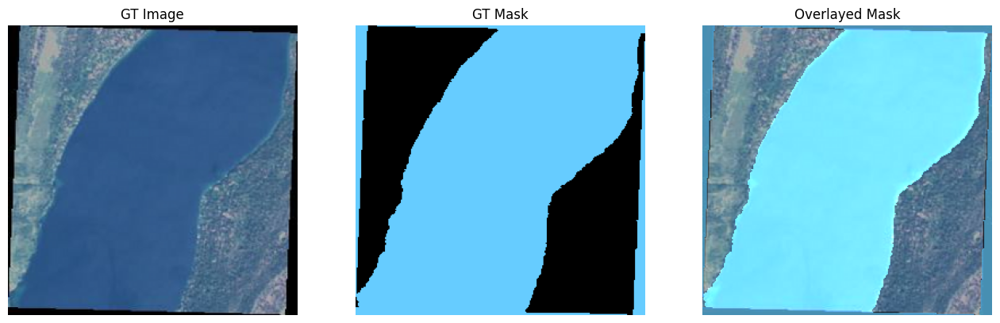

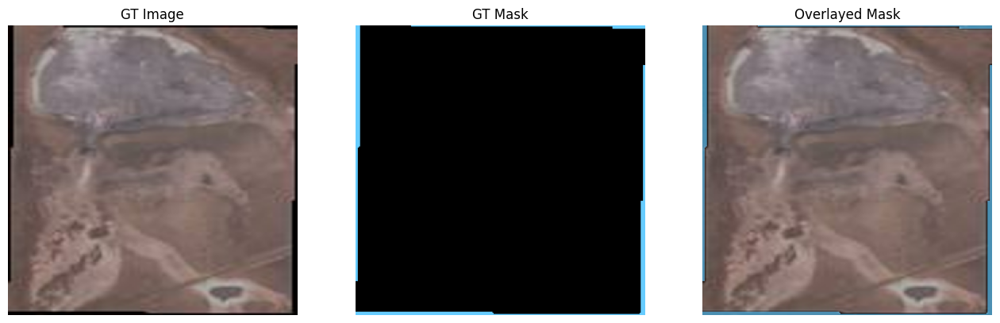

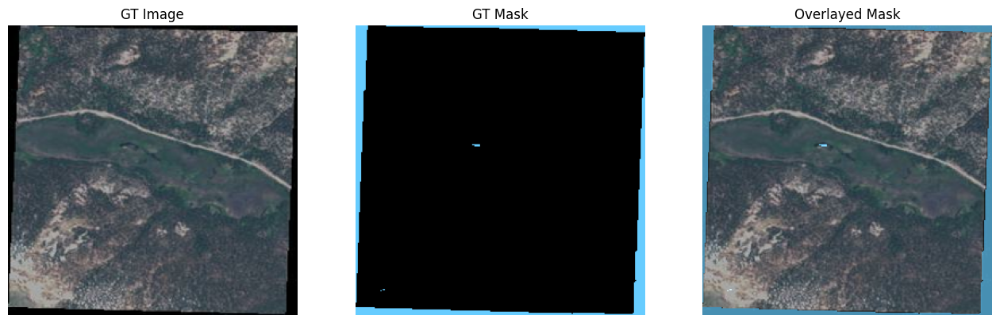

In [16]:
# Visualize dataset
plot_train_ds = train_ds.map(unpackage_inputs).batch(3)
image_batch, mask_batch = next(iter(plot_train_ds.take(1)))
titles = ["GT Image", "GT Mask", "Overlayed Mask"]
for image, gt_mask in zip(image_batch, mask_batch):
    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask], title_list=titles, figsize=(16, 6), color_mask=True)


In [17]:
# Data augmentation
augment_fn = tf.keras.Sequential(
    [
        keras_cv.layers.RandomFlip(),
        keras_cv.layers.RandomBrightness(factor=data_config.BRIGHTNESS_FACTOR, value_range=(0, 255)),
        keras_cv.layers.RandomContrast(factor=data_config.CONTRAST_FACTOR, value_range=(0, 255)),
    ]
)
train_dataset = (
    train_ds.shuffle(data_config.BATCH_SIZE)
    .map(augment_fn, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(data_config.BATCH_SIZE)
    .map(unpackage_inputs)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
)
valid_dataset = (
    valid_ds.batch(data_config.BATCH_SIZE)
    .map(unpackage_inputs)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
)
test_dataset = (
    test_ds.batch(data_config.BATCH_SIZE)
    .map(unpackage_inputs)
    .prefetch(buffer_size=tf.data.AUTOTUNE)
)

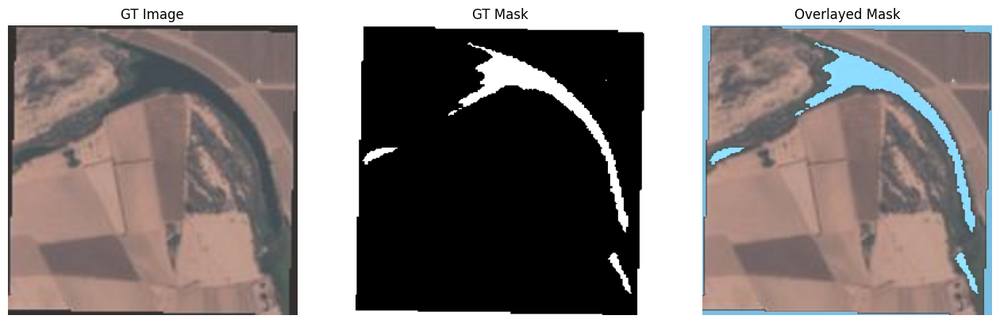

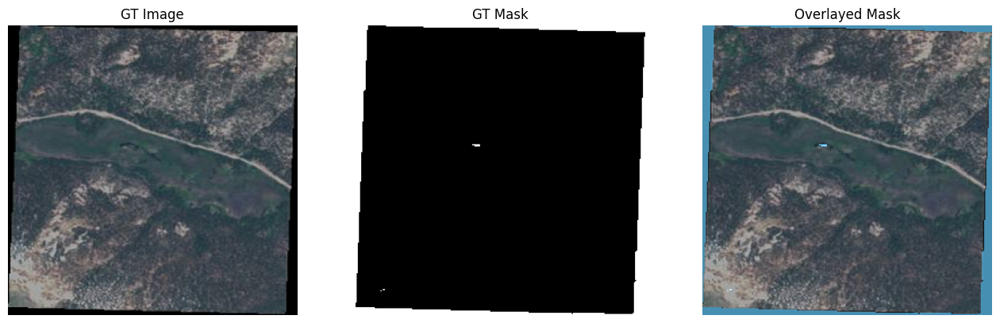

In [18]:
# Visualize augmented dataset
image_batch, aug_mask_batch = next(iter(train_dataset.take(1)))
for idx, (image, gt_mask) in enumerate(zip(image_batch, aug_mask_batch)):
    if idx > 1:
        break
    gt_mask = tf.squeeze(gt_mask, axis=-1).numpy()
    display_image_and_mask([image.numpy().astype(np.uint8), gt_mask], title_list=titles, figsize=(16, 6), color_mask=False)


In [19]:
# Load backbone and build model
backbone = keras_cv.models.ResNet50V2Backbone.from_preset(
    preset=train_config.MODEL,
    input_shape=data_config.IMAGE_SIZE + (3,),
    load_weights=True
)
model = keras_cv.models.segmentation.DeepLabV3Plus(num_classes=data_config.NUM_CLASSES, backbone=backbone)
# print(model.summary())


Attaching 'config.json' from model 'keras/resnetv2/keras/resnet50_v2_imagenet/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/resnetv2/keras/resnet50_v2_imagenet/2' to your Kaggle notebook...
Attaching 'model.weights.h5' from model 'keras/resnetv2/keras/resnet50_v2_imagenet/2' to your Kaggle notebook...


In [20]:

# Mean IOU metric
def mean_iou(y_true, y_pred):
    num_classes = y_pred.shape[-1]
    y_true = tf.squeeze(y_true, axis=-1)
    y_true = tf.one_hot(tf.cast(y_true, tf.int32), num_classes, axis=-1)
    y_pred = tf.one_hot(tf.math.argmax(y_pred, axis=-1), num_classes, axis=-1)
    intersection = tf.math.reduce_sum(y_true * y_pred, axis=(1, 2))
    total = tf.math.reduce_sum(y_true, axis=(1, 2)) + tf.math.reduce_sum(y_pred, axis=(1, 2))
    union = total - intersection
    is_class_present = tf.cast(tf.math.not_equal(total, 0), dtype=tf.float32)
    num_classes_present = tf.math.reduce_sum(is_class_present, axis=1)
    iou = tf.math.divide_no_nan(intersection, union)
    iou = tf.math.reduce_sum(iou, axis=1) / num_classes_present
    mean_iou = tf.math.reduce_mean(iou)
    return mean_iou



In [21]:
# Callbacks

def get_callbacks(train_config, monitor="val_mean_iou", mode="max", save_weights_only=True, save_best_only=True, patience=5):
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
        log_dir=train_config.LOGS_DIR,
        histogram_freq=20,
        write_graph=False,
        update_freq="epoch",  # Set update_freq to 'epoch'
    )
    checkpoint_filepath = train_config.CKPT_DIR
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_filepath,
        save_weights_only=save_weights_only,
        monitor=monitor,
        mode=mode,
        save_best_only=save_best_only,
        verbose=1,
        # patience=patience  # Add patience parameter
    )
    return [tensorboard_callback, model_checkpoint_callback]



In [22]:
# Define precision, recall, f1_score, and mse functions
def precision(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    true_positives = tf.reduce_sum(y_true * y_pred)
    predicted_positives = tf.reduce_sum(y_pred)
    precision = true_positives / (predicted_positives + tf.keras.backend.epsilon())
    return precision

def recall(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    true_positives = tf.reduce_sum(y_true * y_pred)
    possible_positives = tf.reduce_sum(y_true)
    recall = true_positives / (possible_positives + tf.keras.backend.epsilon())
    return recall

def f1_score(y_true, y_pred):
    prec = precision(y_true, y_pred)
    rec = recall(y_true, y_pred)
    return 2 * (prec * rec) / (prec + rec + tf.keras.backend.epsilon())

def mse(y_true, y_pred):
    return tf.keras.losses.MeanSquaredError()(y_true, y_pred)

In [23]:
# Build model
callbacks = get_callbacks(train_config)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)


model.compile(
    optimizer=tf.keras.optimizers.Adam(train_config.LEARNING_RATE),
    loss=loss_fn,
    metrics=["accuracy", mean_iou, precision, recall, f1_score, mse],
)

In [24]:
# Training the model
history = model.fit(
    train_dataset,
    epochs=train_config.EPOCHS,
    validation_data=valid_dataset,
    callbacks=callbacks
)

143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 779ms/step - accuracy: 0.7316 - f1_score: 0.6526 - loss: 0.5710 - mean_iou: 0.5264 - mse: 0.3578 - precision: 0.6316 - recall: 0.7395
Epoch 1: val_mean_iou improved from -inf to 0.63361, saving model to checkpoints/deeplabv3_plus_resnet50_v2.weights.h5
143/143 ━━━━━━━━━━━━━━━━━━━━ 163s 879ms/step - accuracy: 0.7321 - f1_score: 0.6531 - loss: 0.5700 - mean_iou: 0.5270 - mse: 0.3579 - precision: 0.6325 - recall: 0.7393 - val_accuracy: 0.8471 - val_f1_score: 0.7327 - val_loss: 0.3699 - val_mean_iou: 0.6336 - val_mse: 0.3885 - val_precision: 0.8052 - val_recall: 0.6782


In [25]:
def precision(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    true_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true * y_pred, 0, 1)))
    predicted_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + tf.keras.backend.epsilon())
    return precision


def recall(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    true_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true * y_pred, 0, 1)))
    possible_positives = tf.keras.backend.sum(tf.keras.backend.round(tf.keras.backend.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + tf.keras.backend.epsilon())
    return recall


def f1_score(y_true, y_pred):
    prec = precision(y_true, y_pred)
    rec = recall(y_true, y_pred)
    return 2 * (prec * rec) / (prec + rec + tf.keras.backend.epsilon())

def mse(y_true, y_pred):
    return tf.keras.losses.MeanSquaredError()(y_true, y_pred)

# Add these custom metrics to the model compilation
model.compile(
    optimizer=tf.keras.optimizers.Adam(train_config.LEARNING_RATE),
    loss=loss_fn,
    metrics=["accuracy", mean_iou, precision, recall, f1_score, mse],
)





In [26]:
# Define a function to plot the metrics

def plot_metrics(history, metric_name, title):
    plt.figure(figsize=(9, 4))
    plt.plot(history.history[metric_name])
    plt.plot(history.history[f'val_{metric_name}'])
    plt.title(f'Model {title}')
    plt.xlabel('Epoch')
    plt.ylabel(metric_name.capitalize())
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.grid(True)
    plt.show()

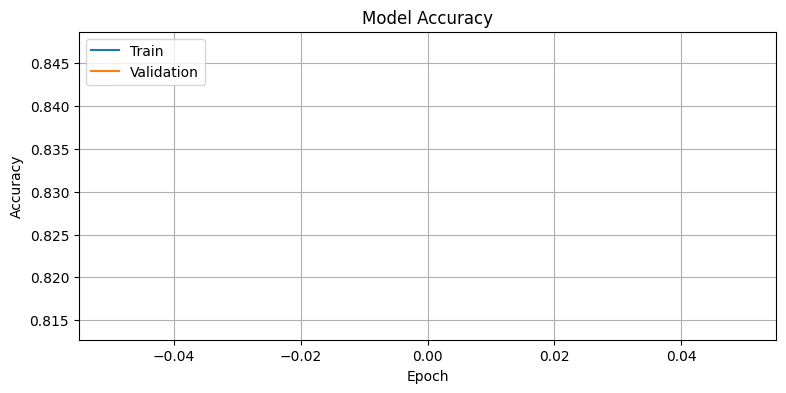

<Figure size 640x480 with 0 Axes>

In [27]:
# Plot accuracy
plot_metrics(history, 'accuracy', 'Accuracy')
plt.savefig("Accuracy.png")



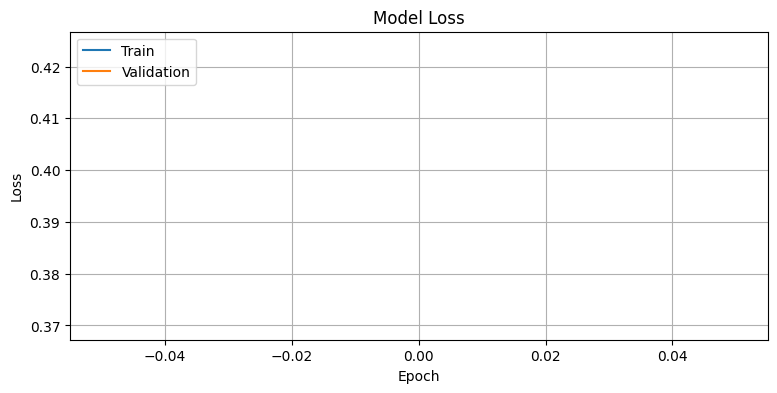

<Figure size 640x480 with 0 Axes>

In [28]:
plot_metrics(history, 'loss', 'Loss')
plt.savefig("loss.png")

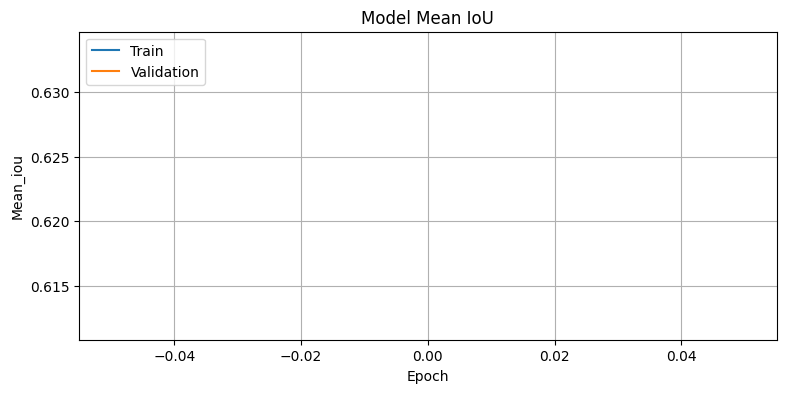

<Figure size 640x480 with 0 Axes>

In [29]:
# Plot mean IoU
plot_metrics(history, 'mean_iou', 'Mean IoU')
plt.savefig("mean IoU.png")



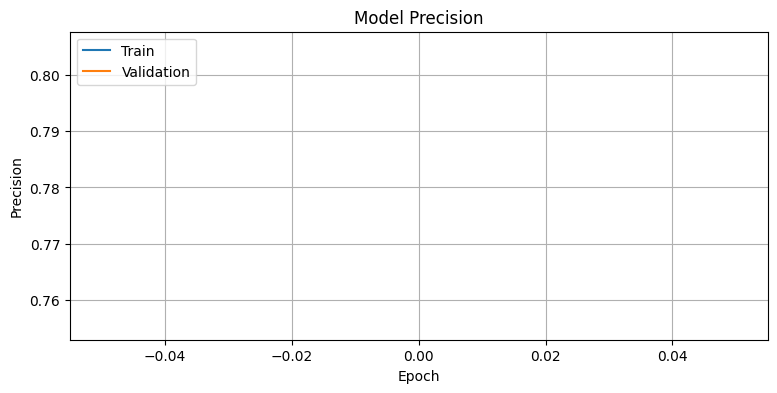

<Figure size 640x480 with 0 Axes>

In [30]:
# Plot precision
plot_metrics(history, 'precision', 'Precision')
plt.savefig("Precision.png")


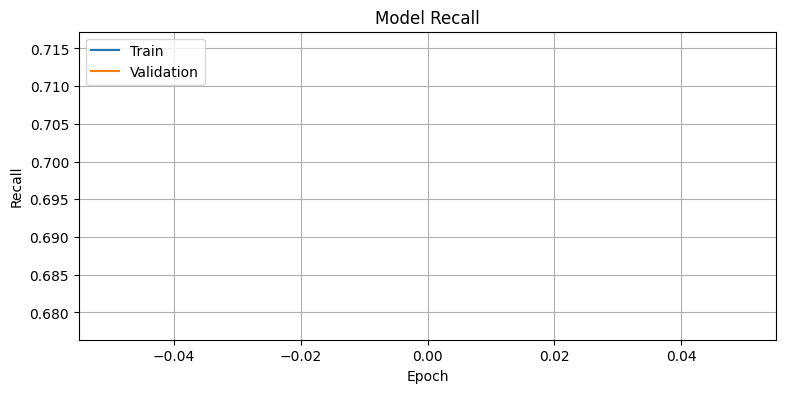

<Figure size 640x480 with 0 Axes>

In [31]:
# Plot recall
plot_metrics(history, 'recall', 'Recall')
plt.savefig("recall.png")


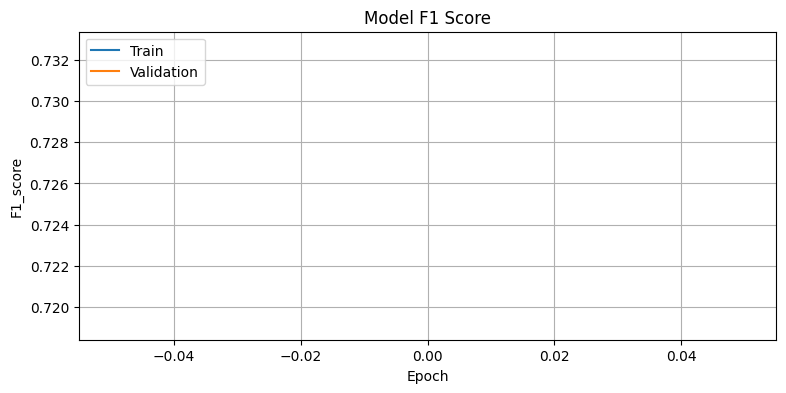

<Figure size 640x480 with 0 Axes>

In [32]:

# Plot F1 score
plot_metrics(history, 'f1_score', 'F1 Score')
plt.savefig("F-1 Score.png")



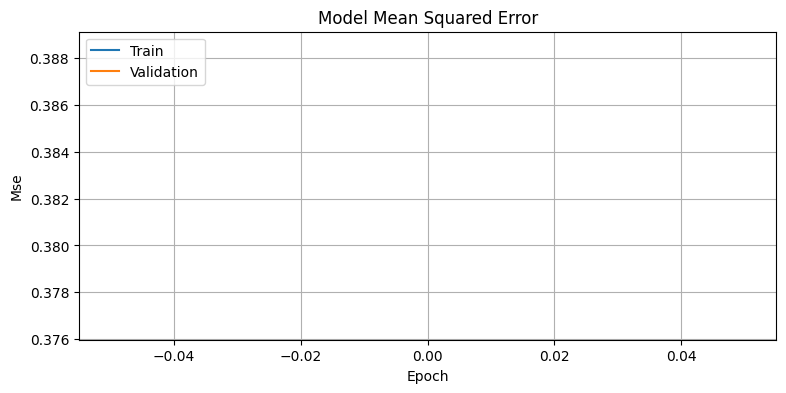

<Figure size 640x480 with 0 Axes>

In [33]:
# Plot MSE
plot_metrics(history, 'mse', 'Mean Squared Error')
plt.savefig("MSE.png")

#### Load Fine-tuned Model Weights

In [34]:
print(len(test_ds))
print(len(train_ds))
print(len(valid_ds))
dataset_size=len(test_ds)+len(train_ds)+len(valid_ds)
print(f'\nTotal size of dataset : {dataset_size}')

284
2273
284

Total size of dataset : 2841


In [35]:
import tensorflow as tf
import numpy as np

# Combine training and validation datasets into a single evaluation dataset
eval_ds = train_ds.concatenate(valid_ds).batch(data_config.BATCH_SIZE)

# Initialize accumulators for metrics
total_accuracy = 0.0
total_precision = 0.0
total_recall = 0.0
total_mse = 0.0
total_loss = 0.0
total_f1 = 0.0
total_iou = 0.0
total_samples = 0

# Define precision, recall, and F1 score functions
def precision(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    true_positives = tf.reduce_sum(y_true * y_pred)
    predicted_positives = tf.reduce_sum(y_pred)
    precision = true_positives / (predicted_positives + tf.keras.backend.epsilon())
    return precision

def recall(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    true_positives = tf.reduce_sum(y_true * y_pred)
    possible_positives = tf.reduce_sum(y_true)
    recall = true_positives / (possible_positives + tf.keras.backend.epsilon())
    return recall

def f1_score(y_true, y_pred):
    prec = precision(y_true, y_pred)
    rec = recall(y_true, y_pred)
    return 2 * (prec * rec) / (prec + rec + tf.keras.backend.epsilon())

# IoU calculation function
def iou(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)
    y_pred = tf.cast(y_pred, tf.float32)
    y_true = tf.cast(y_true, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(tf.cast(tf.math.logical_or(tf.cast(y_true, tf.bool), tf.cast(y_pred, tf.bool)), tf.float32))
    iou = (intersection + tf.keras.backend.epsilon()) / (union + tf.keras.backend.epsilon())
    return iou

# Evaluation loop
for batch in eval_ds:
    imgs, masks = batch['images'], batch['segmentation_masks']
    total_samples += imgs.shape[0]

    # Make predictions
    prediction = model(imgs, training=False)
    pred_masks = tf.argmax(prediction, axis=-1)
    pred_masks = tf.expand_dims(pred_masks, axis=-1)

    # Calculate loss
    loss = loss_fn(masks, prediction)

    # Calculate metrics
    total_loss += loss.numpy() * imgs.shape[0]
    total_accuracy += tf.keras.metrics.SparseCategoricalAccuracy()(masks, prediction).numpy() * imgs.shape[0]
    total_precision += precision(masks, prediction).numpy() * imgs.shape[0]
    total_recall += recall(masks, prediction).numpy() * imgs.shape[0]
    total_mse += tf.keras.losses.MeanSquaredError()(tf.cast(masks, tf.float32), tf.cast(pred_masks, tf.float32)).numpy() * imgs.shape[0]
    total_f1 += f1_score(masks, prediction).numpy() * imgs.shape[0]
    total_iou += iou(masks, prediction).numpy() * imgs.shape[0]

# Compute overall metrics
overall_accuracy = total_accuracy / total_samples
overall_precision = total_precision / total_samples
overall_recall = total_recall / total_samples
overall_mse = total_mse / total_samples
overall_loss = total_loss / total_samples
overall_f1 = total_f1 / total_samples
overall_iou = total_iou / total_samples

print(f"Overall Accuracy: {overall_accuracy}")
print(f"Overall Precision: {overall_precision}")
print(f"Overall Recall: {overall_recall}")
print(f"Overall MSE: {overall_mse}")
print(f"Overall Loss: {overall_loss}")
print(f"Overall F1 Score: {overall_f1}")
print(f"Overall IoU: {overall_iou}")


Overall Accuracy: 0.8639375809631079
Overall Precision: 0.8377625022635685
Overall Recall: 0.7036839043390112
Overall MSE: 0.13606241918840956
Overall Loss: 0.3371891391128127
Overall F1 Score: 0.7622484315593214
Overall IoU: 0.6194124384741323


In [36]:

import tensorflow as tf
import numpy as np

# Combine training and validation datasets into a single evaluation dataset
eval_ds = test_ds.batch(data_config.BATCH_SIZE)

# Initialize accumulators for metrics
total_accuracy = 0.0
total_precision = 0.0
total_recall = 0.0
total_mse = 0.0
total_loss = 0.0
total_f1 = 0.0
total_iou = 0.0
total_samples = 0

# Define precision, recall, and F1 score functions
def precision(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    true_positives = tf.reduce_sum(y_true * y_pred)
    predicted_positives = tf.reduce_sum(y_pred)
    precision = true_positives / (predicted_positives + tf.keras.backend.epsilon())
    return precision

def recall(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    true_positives = tf.reduce_sum(y_true * y_pred)
    possible_positives = tf.reduce_sum(y_true)
    recall = true_positives / (possible_positives + tf.keras.backend.epsilon())
    return recall

def f1_score(y_true, y_pred):
    prec = precision(y_true, y_pred)
    rec = recall(y_true, y_pred)
    return 2 * (prec * rec) / (prec + rec + tf.keras.backend.epsilon())

# IoU calculation function
def iou(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)
    y_pred = tf.cast(y_pred, tf.float32)
    y_true = tf.cast(y_true, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(tf.cast(tf.math.logical_or(tf.cast(y_true, tf.bool), tf.cast(y_pred, tf.bool)), tf.float32))
    iou = (intersection + tf.keras.backend.epsilon()) / (union + tf.keras.backend.epsilon())
    return iou

# Evaluation loop
for batch in eval_ds:
    imgs, masks = batch['images'], batch['segmentation_masks']
    total_samples += imgs.shape[0]

    # Make predictions
    prediction = model(imgs, training=False)
    pred_masks = tf.argmax(prediction, axis=-1)
    pred_masks = tf.expand_dims(pred_masks, axis=-1)

    # Calculate loss
    loss = loss_fn(masks, prediction)

    # Calculate metrics
    total_loss += loss.numpy() * imgs.shape[0]
    total_accuracy += tf.keras.metrics.SparseCategoricalAccuracy()(masks, prediction).numpy() * imgs.shape[0]
    total_precision += precision(masks, prediction).numpy() * imgs.shape[0]
    total_recall += recall(masks, prediction).numpy() * imgs.shape[0]
    total_mse += tf.keras.losses.MeanSquaredError()(tf.cast(masks, tf.float32), tf.cast(pred_masks, tf.float32)).numpy() * imgs.shape[0]
    total_f1 += f1_score(masks, prediction).numpy() * imgs.shape[0]
    total_iou += iou(masks, prediction).numpy() * imgs.shape[0]

# Compute overall metrics
overall_accuracy = total_accuracy / total_samples
overall_precision = total_precision / total_samples
overall_recall = total_recall / total_samples
overall_mse = total_mse / total_samples
overall_loss = total_loss / total_samples
overall_f1 = total_f1 / total_samples
overall_iou = total_iou / total_samples

print(f"Overall Accuracy on test: {overall_accuracy}")
print(f"Overall Precision on test: {overall_precision}")
print(f"Overall Recall on test: {overall_recall}")
print(f"Overall MSE on test: {overall_mse}")
print(f"Overall Loss on test: {overall_loss}")
print(f"Overall F1 Score on test: {overall_f1}")
print(f"Overall IoU on test: {overall_iou}")


Overall Accuracy on test: 0.8587436944666044
Overall Precision on test: 0.8279317827291892
Overall Recall on test: 0.6867768957581318
Overall MSE on test: 0.1412563055333957
Overall Loss on test: 0.35187325007478953
Overall F1 Score on test: 0.7496729518326235
Overall IoU on test: 0.6026592968215405


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


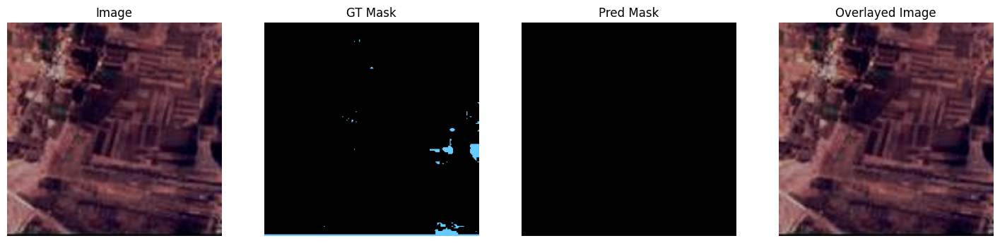

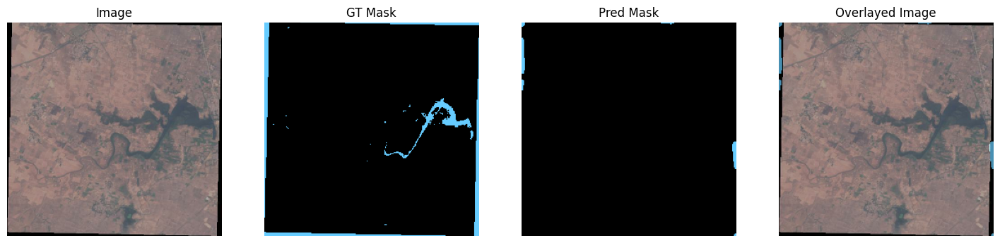

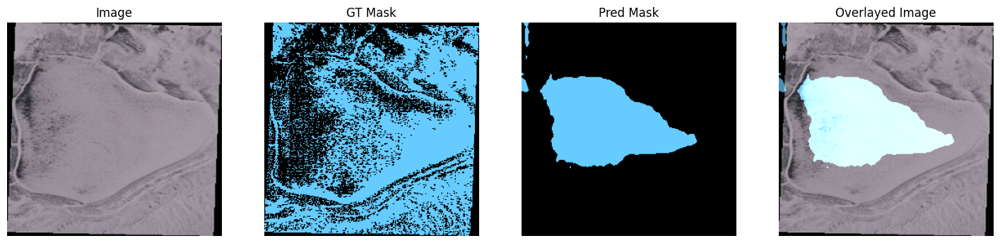

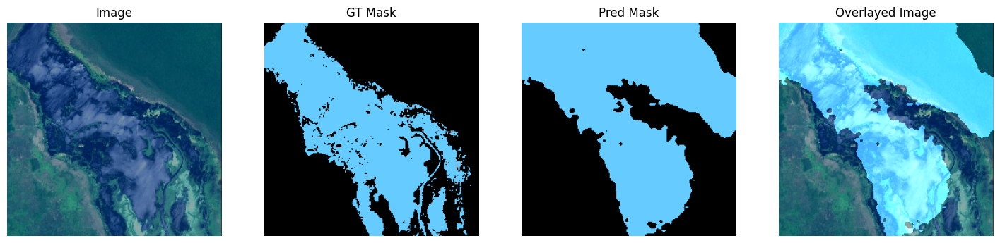

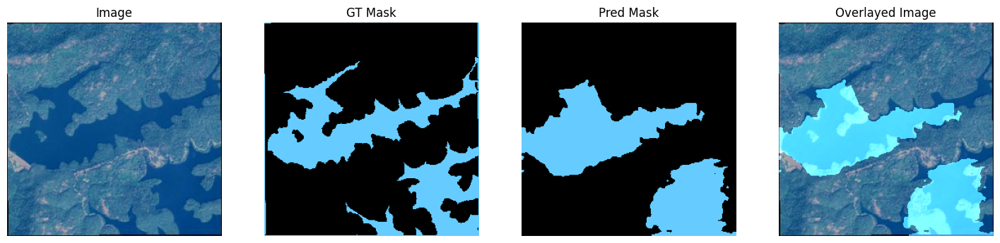

In [37]:
# Evaluate the model on the test dataset
# test_results = model.evaluate(test_dataset)

# print(f"Test Results - Loss: {test_results[0]} - Accuracy: {test_results[1]} - Mean IOU: {test_results[2]}")

# Function to predict and display results on test dataset
def predict_and_display(model, test_dataset, num_images=5):
    for image_batch, mask_batch in test_dataset.take(1):
        pred_mask_batch = model.predict(image_batch)
        for i in range(num_images):
            image = image_batch[i].numpy().astype(np.uint8)
            gt_mask = tf.squeeze(mask_batch[i], axis=-1).numpy()
            pred_mask = tf.argmax(pred_mask_batch[i], axis=-1).numpy()
            display_image_and_mask([image, gt_mask, pred_mask], title_list=["Image", "GT Mask", "Pred Mask"], figsize=(18, 6), color_mask=True)

# Predict and display results on the test dataset
predict_and_display(model, test_dataset)


In [38]:
model.load_weights(train_config.CKPT_DIR)

/opt/conda/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:418: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 392 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


#### Perform Evaluation

In [39]:
print(len(valid_dataset))
print(len(train_dataset))
print(len(test_dataset))

18
143
18


In [40]:
evaluate = model.evaluate(valid_dataset)

18/18 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.8444 - f1_score: 0.7164 - loss: 0.3794 - mean_iou: 0.6247 - mse: 0.3871 - precision: 0.3076 - recall: 1.0000


In [41]:
evaluate = model.evaluate(test_dataset)

18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 221ms/step - accuracy: 0.8578 - f1_score: 0.7440 - loss: 0.3570 - mean_iou: 0.6304 - mse: 0.3875 - precision: 0.3094 - recall: 1.0000


## Prediction with Fine-tuned Model

Now that the model training of DeepLabv3 has been completed, let's test it by making predictions on a few sample images.

In [42]:
def inference(model, dataset, samples_to_plot):

    num_batches_to_process = 2
    count = 0
    stop_plot = False

    titles = ["Image", "GT Mask", "Pred Mask", "Overlayed Prediction"]

    for idx, data in enumerate(dataset):

        if stop_plot:
            break

        batch_img, batch_mask = data[0], data[1]
        batch_pred = (model.predict(batch_img)).astype('float32')
        batch_pred = batch_pred.argmax(axis=-1)
        
        batch_img  = batch_img.numpy().astype('uint8')
        batch_mask = batch_mask.numpy().squeeze(axis=-1)

        for image, mask, pred in zip(batch_img, batch_mask, batch_pred):
            count+=1
            display_image_and_mask([image, mask, pred],
                                  title_list=titles,
                                   figsize=(20,8),
                                   color_mask=True)
            if count >= samples_to_plot:
                stop_plot=True
                break
            

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step


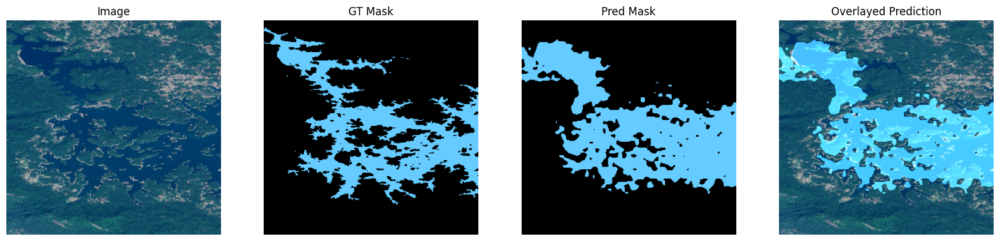

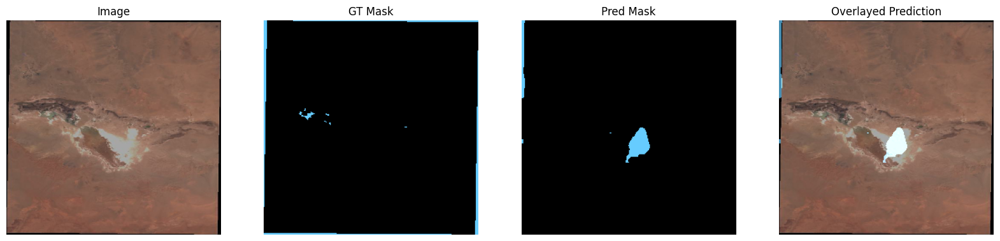

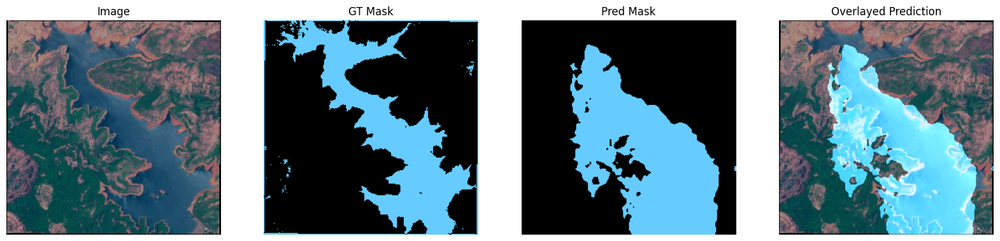

In [43]:
inference(model, valid_dataset, samples_to_plot=3)

In [44]:

# Fine-tuning
print("Fine-tuning the model...")
backbone.trainable = True
for layer in model.layers:
    if isinstance(layer, keras_cv.models.ResNet50V2Backbone):
        layer.trainable = True

fine_tune_callbacks = get_callbacks(train_config, monitor="val_loss", mode="min")

model.compile(
    optimizer=tf.keras.optimizers.Adam(train_config.FINE_TUNE_LEARNING_RATE),
    loss=loss_fn,
    metrics=["accuracy", mean_iou, precision, recall, f1_score, mse],
)

fine_tune_history = model.fit(
    train_dataset,
    epochs=train_config.FINE_TUNE_EPOCHS,
    validation_data=valid_dataset,
    callbacks=fine_tune_callbacks
)

Fine-tuning the model...
143/143 ━━━━━━━━━━━━━━━━━━━━ 0s 778ms/step - accuracy: 0.8812 - f1_score: 0.7965 - loss: 0.2905 - mean_iou: 0.6952 - mse: 0.4032 - precision: 0.8619 - recall: 0.7450
Epoch 1: val_loss improved from inf to 0.31592, saving model to checkpoints/deeplabv3_plus_resnet50_v2.weights.h5
143/143 ━━━━━━━━━━━━━━━━━━━━ 160s 881ms/step - accuracy: 0.8812 - f1_score: 0.7965 - loss: 0.2905 - mean_iou: 0.6953 - mse: 0.4032 - precision: 0.8619 - recall: 0.7451 - val_accuracy: 0.8686 - val_f1_score: 0.7740 - val_loss: 0.3159 - val_mean_iou: 0.6898 - val_mse: 0.3880 - val_precision: 0.8335 - val_recall: 0.7282


In [45]:
# Evaluate the model on test dataset
test_results = model.evaluate(test_dataset)

print("\nTest results - Loss: {:.4f}, Accuracy: {:.4f}, Mean IOU: {:.4f}, Precision: {:.4f}, Recall: {:.4f}, F1 Score: {:.4f}, MSE: {:.4f}".format(*test_results))
print("\nTest results - Loss: {:.4f}, Accuracy: {:.4f}, Mean IOU: {:.4f}, Precision: {:.4f}, Recall: {:.4f}, F1 Score: {:.4f}, MSE: {:.4f}".format(*test_results))


18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 221ms/step - accuracy: 0.8762 - f1_score: 0.7818 - loss: 0.3066 - mean_iou: 0.6904 - mse: 0.3856 - precision: 0.8473 - recall: 0.7282

Test results - Loss: 0.3037, Accuracy: 0.8797, Mean IOU: 0.6976, Precision: 0.8539, Recall: 0.7402, F1 Score: 0.7918, MSE: 0.3875

Test results - Loss: 0.3037, Accuracy: 0.8797, Mean IOU: 0.6976, Precision: 0.8539, Recall: 0.7402, F1 Score: 0.7918, MSE: 0.3875


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


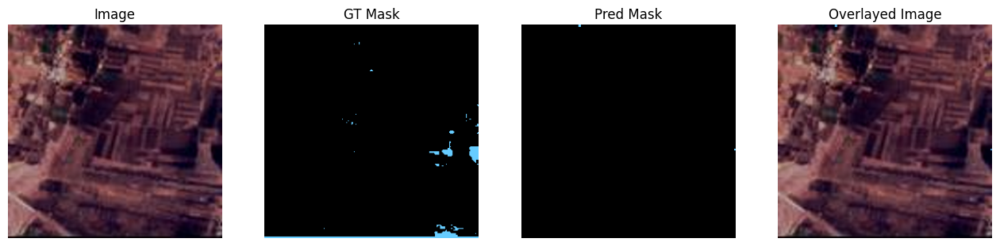

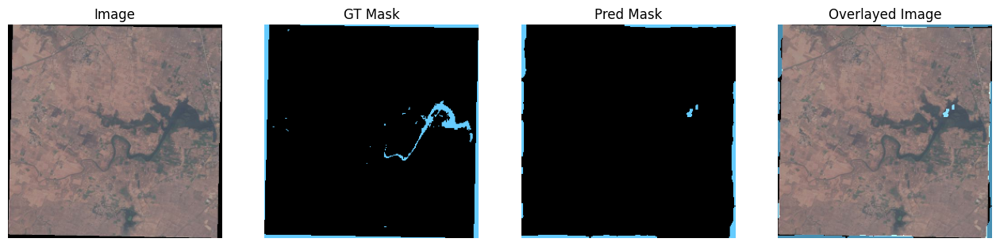

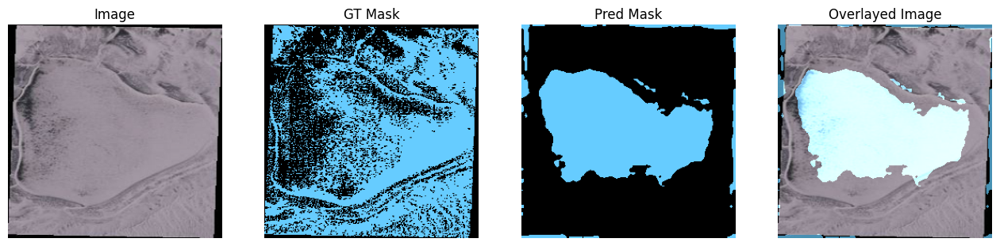

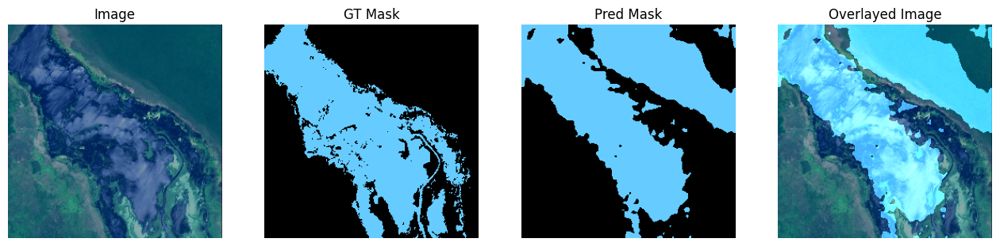

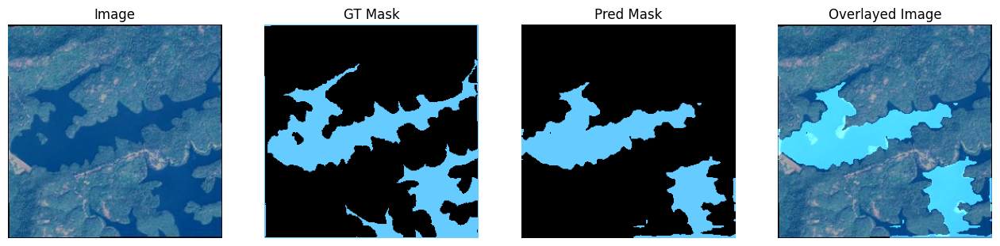

...

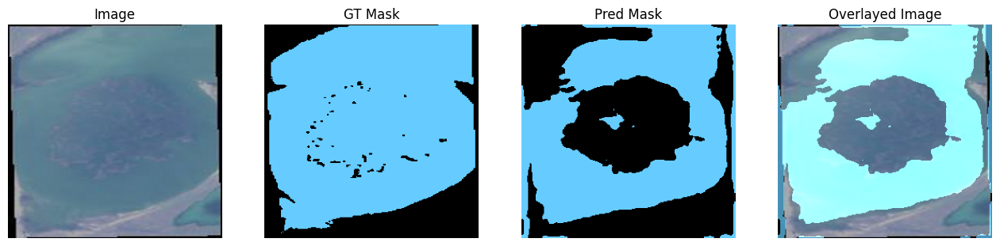

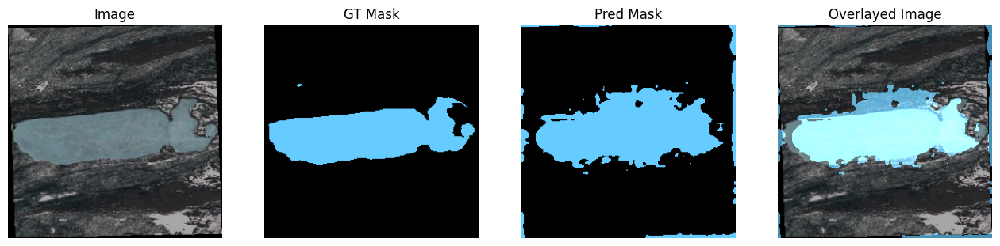

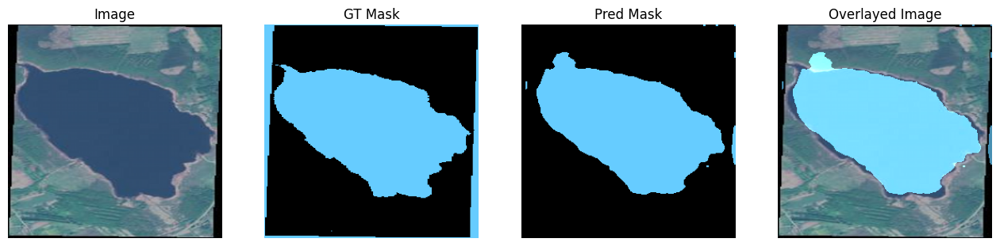

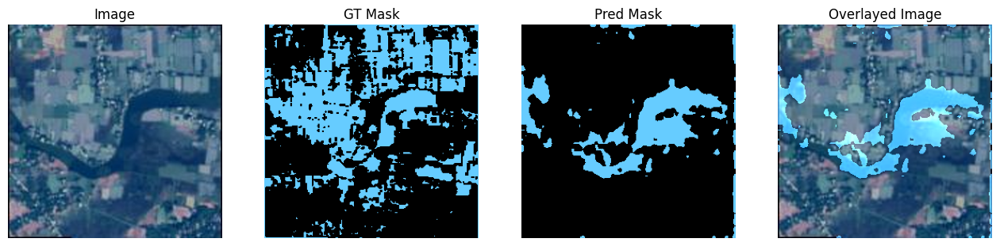

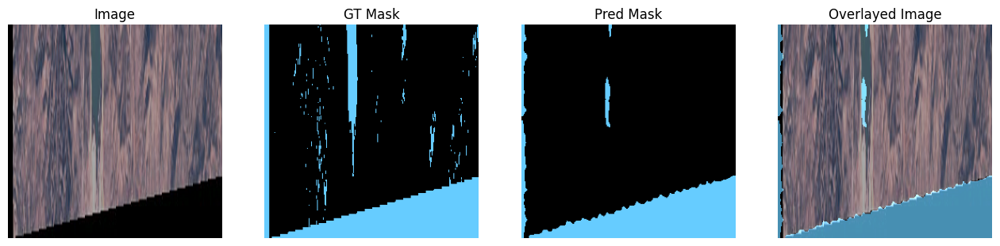

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


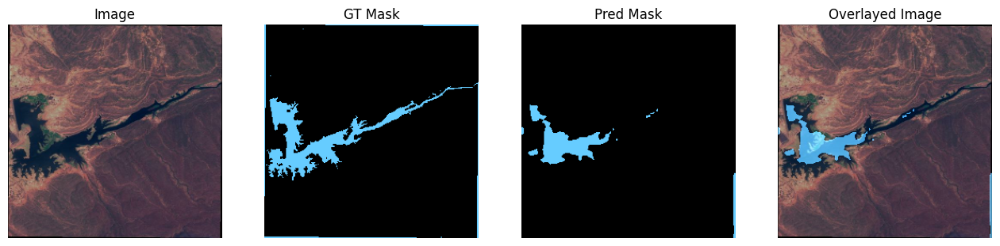

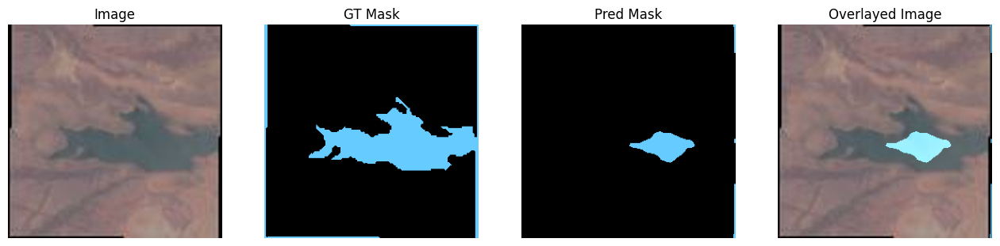

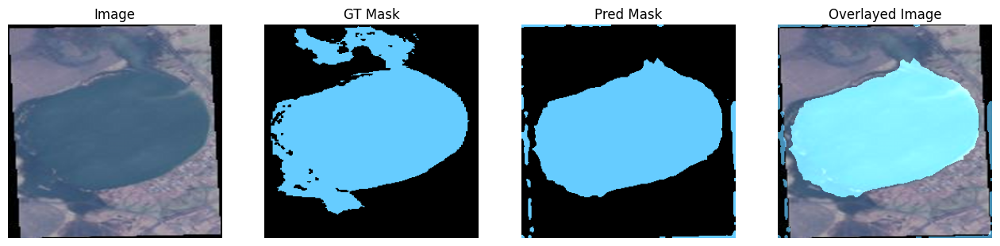

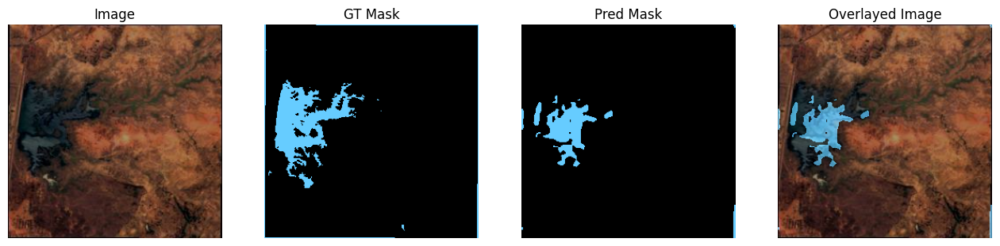

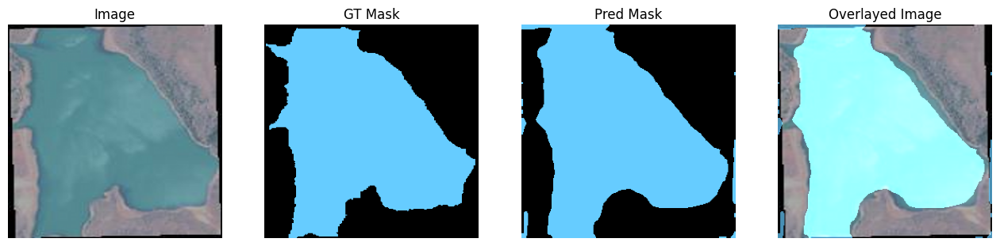

...

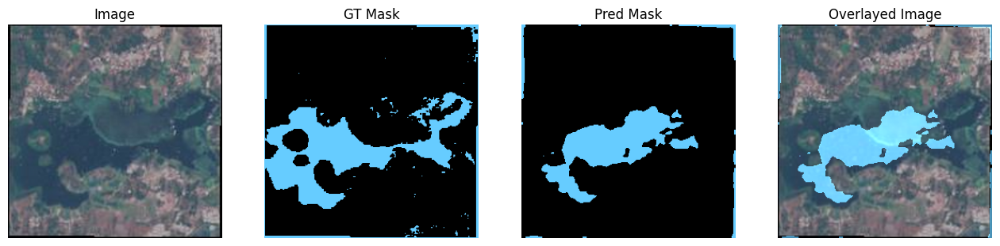

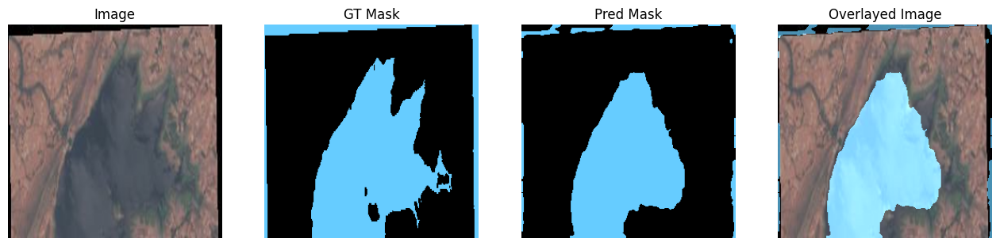

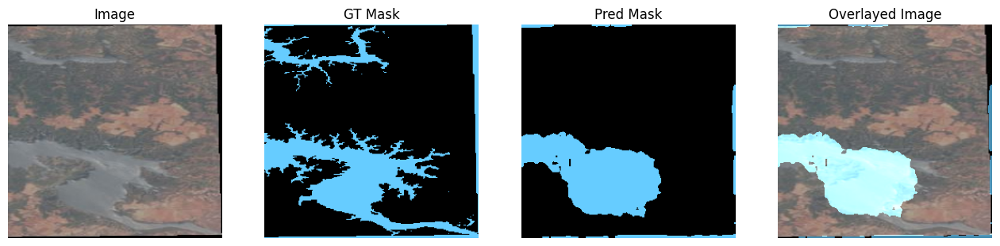

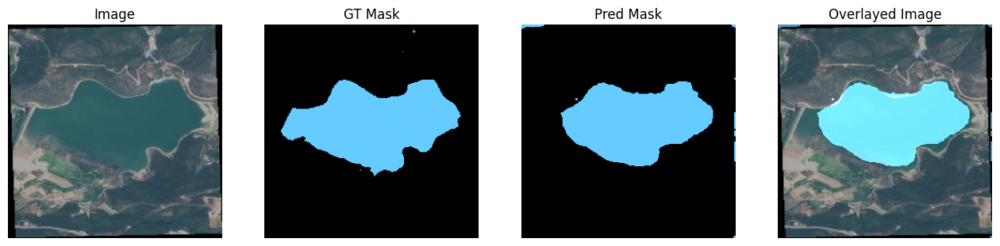

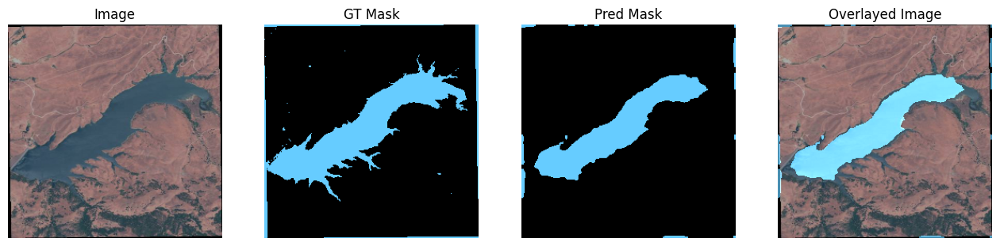

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


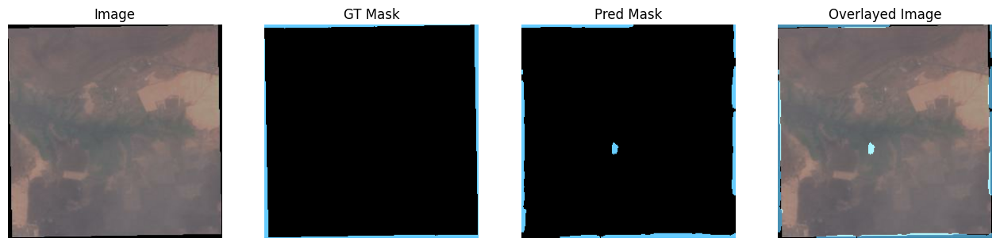

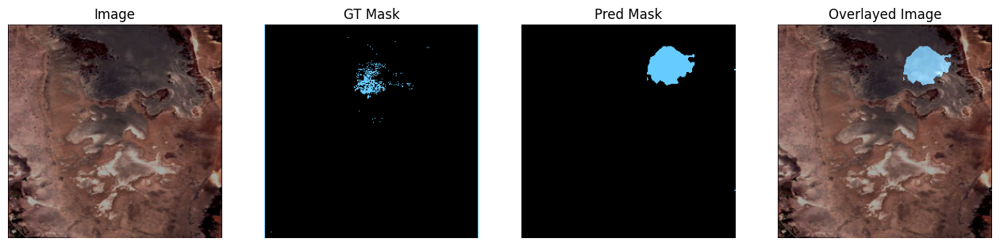

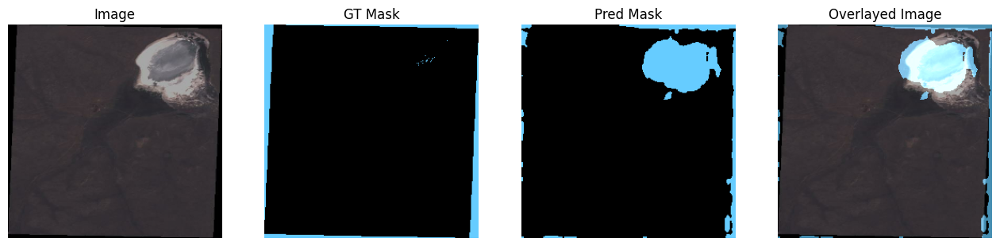

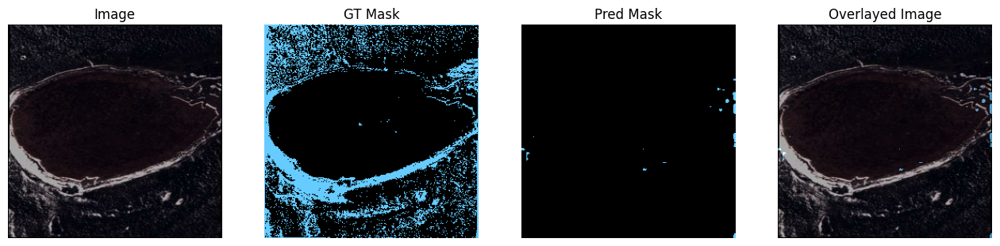

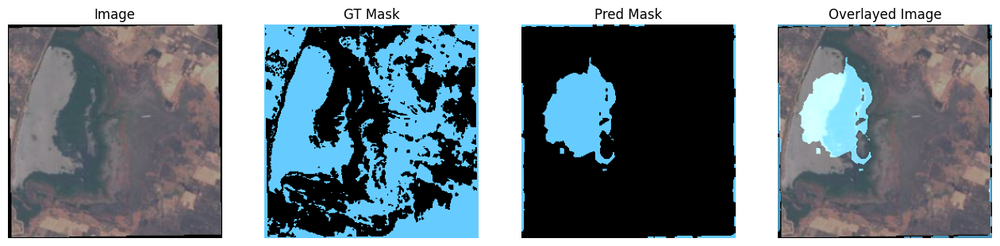

...

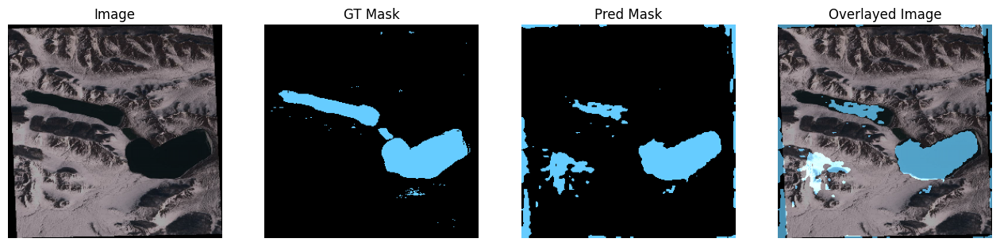

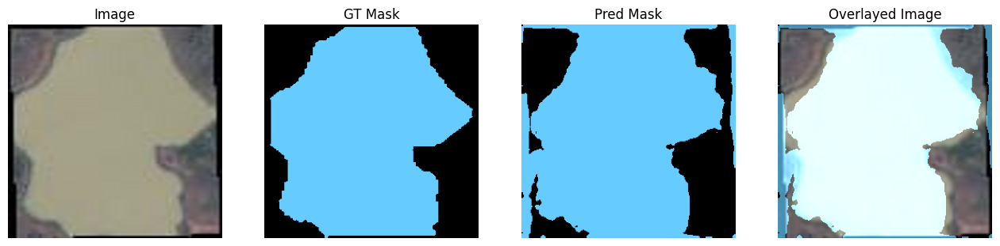

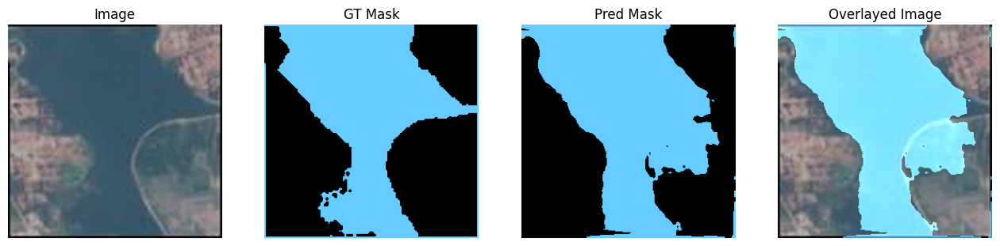

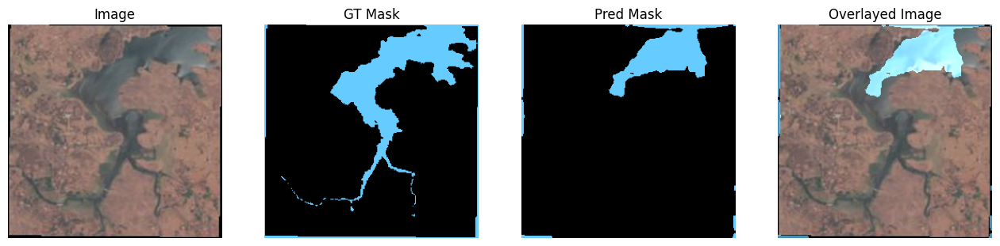

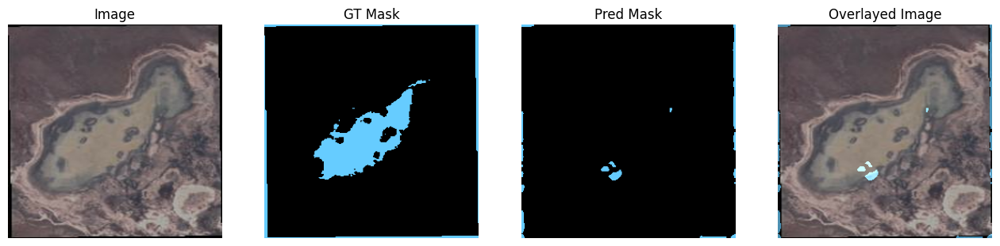

In [46]:
# Visualize predictions on test set
def visualize_predictions(dataset, model, num_images=3):
    for images, masks in dataset.take(num_images):
        predictions = model.predict(images)
        predictions = tf.argmax(predictions, axis=-1)
        for i in range(len(images)):
            gt_mask = tf.squeeze(masks[i], axis=-1).numpy()
            pred_mask = predictions[i].numpy()
            display_image_and_mask([images[i].numpy().astype(np.uint8), gt_mask, pred_mask], title_list=["Image", "GT Mask", "Pred Mask"], figsize=(16, 6), color_mask=True)

# Visualize predictions on test dataset
visualize_predictions(test_dataset, model, num_images=3)